# San Francisco Data Analysis

In this notebook, I'll analyze a collection of data sets from the [San Francisco Open Data Portal](http://data.sfgov.org/) and [Zillow](https://www.zillow.com/). The data sets have been stored in the SQLite database `sf_data.sqlite`. The database contains the following tables:

Table                   | Description
----------------------- | -----------
`crime`                 | Crime reports dating back to 2010.
`mobile_food_locations` | List of all locations where mobile food vendors sell.
`mobile_food_permits`   | List of all mobile food vendor permits. More details [here](https://data.sfgov.org/api/views/rqzj-sfat/files/8g2f5RV4PEk0_b24iJEtgEet9gnh_eA27GlqoOjjK4k?download=true&filename=DPW_DataDictionary_Mobile-Food-Facility-Permit.pdf).
`mobile_food_schedule`  | Schedules for mobile food vendors.
`noise`                 | Noise complaints dating back to August 2015.
`parking`               | List of all parking lots.
`parks`                 | List of all parks.
`schools`               | List of all schools.
`zillow`                | Zillow rent and housing statistics dating back to 1996. More details [here](https://www.zillow.com/research/data/).


In [1]:
import sqlite3 as sql
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd

import folium
from folium.plugins import MarkerCluster

import geopandas as gpd
from shapely.geometry import Point

In [ ]:
from mpl_toolkits.basemap import Basemap
import numpy as np
from matplotlib.patches import Polygon

In [2]:
db=sql.connect('sf_data.sqlite')

### Crime

First I want to dig into the crime data.

In [3]:
crime=pd.read_sql('''
SELECT *,
    CASE
        WHEN time(Datetime) BETWEEN '06:00:01' AND '12:00:00' THEN 'morning'
        WHEN time(Datetime) BETWEEN '12:00:01' AND '18:00:00' THEN 'afternoon'
        WHEN time(Datetime) BETWEEN '18:00:01' AND '24:00:00' THEN 'evening'
        WHEN time(Datetime) BETWEEN '00:00:00' AND '06:00:00' THEN 'night'
    END 'Time'
FROM crime''',db)
crime.head()

,IncidntNum,Category,Descript,DayOfWeek,Datetime,PdDistrict,Resolution,Address,Lon,Lat,Time
0,150060275,NON-CRIMINAL,LOST PROPERTY,Monday,2015-01-19 14:00:00,MISSION,NONE,18TH ST / VALENCIA ST,-122.421582,37.761701,afternoon
1,150098210,ROBBERY,"ROBBERY, BODILY FORCE",Sunday,2015-02-01 15:45:00,TENDERLOIN,NONE,300 Block of LEAVENWORTH ST,-122.414406,37.784191,afternoon
2,150098210,ASSAULT,AGGRAVATED ASSAULT WITH BODILY FORCE,Sunday,2015-02-01 15:45:00,TENDERLOIN,NONE,300 Block of LEAVENWORTH ST,-122.414406,37.784191,afternoon
3,150098210,SECONDARY CODES,DOMESTIC VIOLENCE,Sunday,2015-02-01 15:45:00,TENDERLOIN,NONE,300 Block of LEAVENWORTH ST,-122.414406,37.784191,afternoon
4,150098226,VANDALISM,"MALICIOUS MISCHIEF, VANDALISM OF VEHICLES",Tuesday,2015-01-27 19:00:00,NORTHERN,NONE,LOMBARD ST / LAGUNA ST,-122.431119,37.800469,evening


In [9]:
print('There are totally',crime.shape[0],'crime data')

There are totally 1033401 crime data


As we can see, there are totally 1,033,401 crime events from 2015/01/19 to 2016/08/10. One should notice that some rows have the same `IncidntNum`, which mean that one incident may contain more than one crime behavior (For example, row 1,2,3). I will, however, treat each row as independent crime event. Since I am interested in number of all crime behaviors, it is better to consider all the data regardless of `IncidntNum`.

__What is the most dangerous area?__

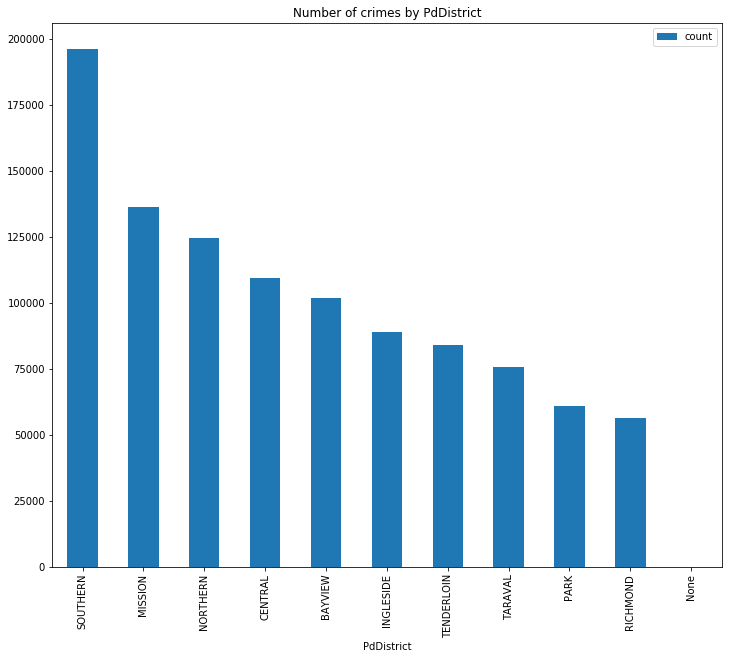

In [5]:
crime_location=pd.read_sql('SELECT PdDistrict, COUNT(*) AS count FROM crime GROUP BY PdDistrict ORDER BY COUNT(*) DESC',db)
crime_location.plot.bar('PdDistrict','count',title='Number of crimes by PdDistrict',figsize=(12,10))

I count the number of crimes in each Police Department District. The par plot clearly shows that Southern PdDistrict is the most dangerous, following by Mission and Northern PdDistricts. 

For better understanding, let's visualize all the districts on map.

In [57]:
my_map=folium.Map(location=[37.76,-122.45],zoom_start=12)


folium.Choropleth(
    geo_data='Current Police Districts.geojson',
    name='choropleth',
    data=crime_location,
    columns=['PdDistrict', 'count'],
    key_on='feature.properties.district',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Number of crimes'
).add_to(my_map)

my_map

Using a Police Department District GeoJson file, I am able to make a choropleth based on number of crimes.

A map is more direct. We can see areas such as Mission Bay, are the most dangerous. The other dangerous parts are areas such as Downtown SF, Financial District. This makes sense as these are the busiest areas in San Francisco

#### What is the most dangerous time in San Francisco?

* __What is the most dangerous day of a week?__

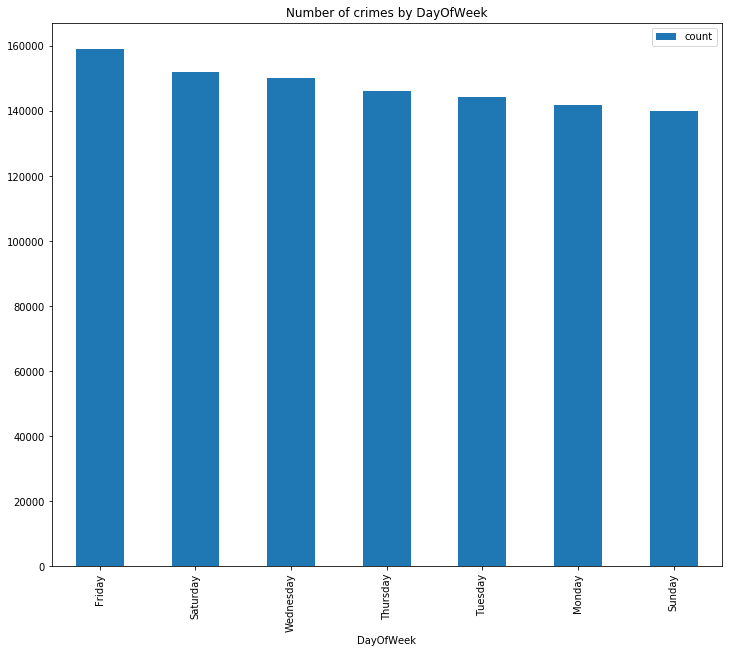

In [17]:
crime_day=pd.read_sql('SELECT DayOfWeek, COUNT(*) AS count FROM crime GROUP BY Dayofweek ORDER BY COUNT(*) DESC',db)
crime_day.plot.bar('DayOfWeek','count',title='Number of crimes by DayOfWeek',figsize=(12,10))

Here I query the number of crimes groupby each day of a week. Not surprisingly, Friday and Sunday are the most dangerous days. This may be because people tend to be crazier on weekends. Actually, the top 4 days on from Wednesday to Saturday, which are the late half of a week. This shows that people get crazier (such as drinking and partying) as weekends approaching. On the other hand, Sunday has the fewest crime records because new work is coming.

* __What is the most dangerous time of a day?__

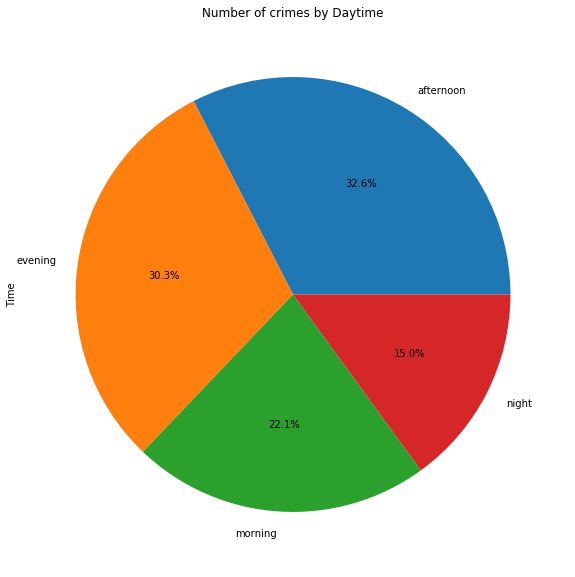

In [15]:
crime['Time'].value_counts().plot.pie(autopct='%1.1f%%',title='Number of crimes by Daytime',figsize=(10,10))

Now I would like to know how crime occur during a day. 

When I query the data from the database, I create a column `Time` that divides a day into:
* Morning (6am - 12pm)
* Afternoon (12pm - 6pm)
* Evening (6pm - 12am)
* Night (12am - 6am)

The pie chart shows afternoon (33%) and evening (30%) have the most crime records. These are the time periods people get actively outside. Night (15%) is the safest time, which makes sense since it is bedtime for most people.

__What is the most dangerous time in each PdDistrict?__

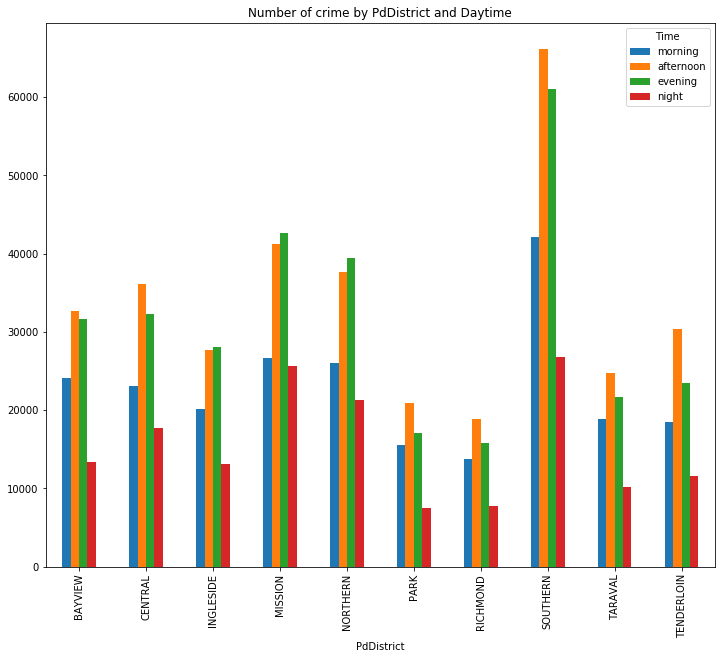

In [27]:
crime.groupby(['PdDistrict','Time']).IncidntNum.count().unstack()[['morning','afternoon','evening','night']]\
.plot.bar(title='Number of crime by PdDistrict and Daytime',figsize=(12,10))

I also would like to check the distribution of crime in each PdDistrict by time period. For all districts, afternoon and evening are the most dangerous time, especially for Southern district. 

One thing to be noticed is for Mission, Northern and Ingleside districts, evening is more dangerous than afternoon. These are places that people like to spend time in after work/ on weekends' night. 

 __What is the most common crime type?__

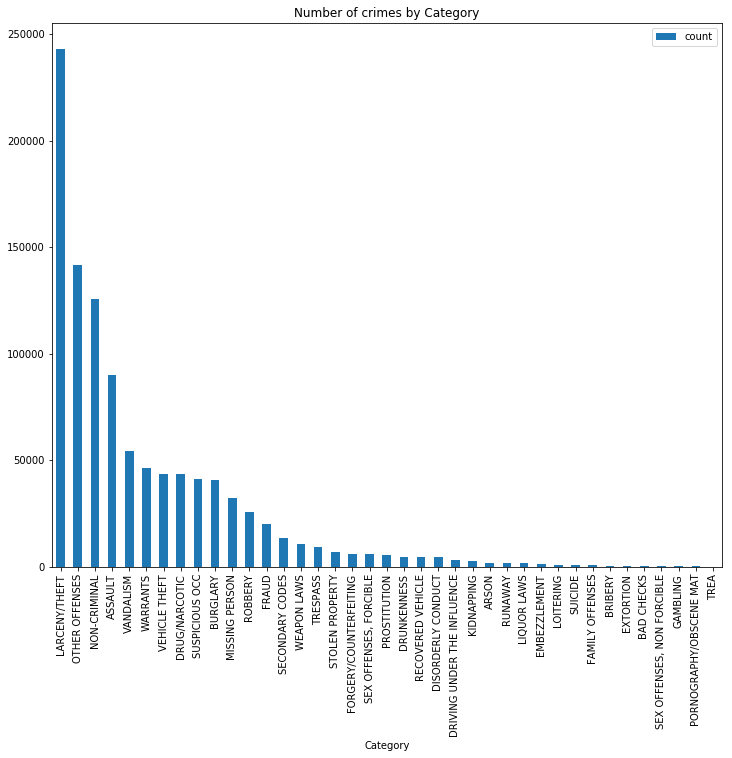

In [28]:
crime_category=pd.read_sql('SELECT Category,COUNT(*) AS count FROM crime GROUP BY Category ORDER BY COUNT(*) DESC',db)
crime_category.plot.bar('Category','count',title='Number of crimes by Category',figsize=(12,10))

Here I want to check what is the most common type of crime. From the bar plot above, we can see that __Larceny/Theft__ dominates, following with __Other Offenses__ and __Non-criminal__. This correlates the result of the previous question, and explains why 12 pm - 12am is the most dangerous. Since at noon, people start to get out for business or lucnch. After 6pm, it is getting dark, and people are not sleeping and may be hanging out with others.  While from 0am to 12am, most people stay at home, so it is hard to steal things.

### Crime vs Housing

In [7]:
zillow=pd.read_sql('SELECT * FROM zillow',db)
zillow.head()

,RegionName,Date,ZriPerSqft_AllHomes,MedianSoldPricePerSqft_AllHomes,PriceToRentRatio_AllHomes,Turnover_AllHomes
0,94109,2010-11-01 00:00:00,3.156,675.1913,19.14,6.0771
1,94110,2010-11-01 00:00:00,2.566,599.6785,18.10,5.4490
2,94122,2010-11-01 00:00:00,2.168,495.4432,17.99,2.4198
3,94080,2010-11-01 00:00:00,1.666,369.5538,18.31,3.8757
4,94112,2010-11-01 00:00:00,2.322,422.4538,14.44,3.1288


In [97]:
sold_price=pd.read_sql(
    '''SELECT RegionName AS zipcode, avg(MedianSoldPricePerSqft_AllHomes) AS Mean_price FROM zillow 
    WHERE MedianSoldPricePerSqft_AllHomes != "NaN" 
    GROUP BY RegionName''',db)
sold_price.head()

,zipcode,Mean_price
0,94080,375.629802
1,94102,626.417276
2,94103,604.009929
3,94104,1336.128581
4,94105,798.257824


In [99]:
sold_price['zipcode']=sold_price['zipcode'].apply(lambda x: str(x))
#convert the zipcodes to string to match geojson data

In [100]:
my_map=folium.Map(location=[37.76,-122.45],zoom_start=12)

folium.GeoJson('San Francisco ZIP Codes.geojson').add_to(my_map)

folium.Choropleth(
    geo_data='San Francisco ZIP Codes.geojson',
    name='choropleth',
    data=sold_price,
    columns=['zipcode', 'Mean_price'],
    key_on='feature.properties.zip_code',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='House Price'
).add_to(my_map)
my_map

I want to check how housing price differ by zipcodes. I use `MedianSoldPricePerSqft_AllHomes` column from table __zillow__ to calculate the mean sold price for each zipcode, and come up with a choropleth map shown above. There are two black areas that have no data (94129, 94130).

The most expensive area is __94104__, which is basically a part of Financial District, following by areas such as Mission Bay and Northern district.

Now let's combine home price and crime data:

In [61]:
sf_zipcode=gpd.read_file('San Francisco ZIP Codes.geojson')
sf_zipcode.head()

,zip_code,zip,st_area_sh,sqmi,state,pop10_sqmi,st_length_,objectid,po_name,pop2010,id,multigeom,geometry
0,94124,94124,135725759.511,4.87,CA,7645.4,112600.382071,55,San Francisco,37233,94124,false,POLYGON ((-122.3800890113633 37.75275898753988...
1,94127,94127,47329282.5099,1.7,CA,11244.7,37576.3897137,56,San Francisco,19116,94127,false,POLYGON ((-122.4442709852785 37.73159598046237...
2,94131,94131,60629097.8877,2.17,CA,11153.0,55831.4693466,57,San Francisco,24202,94131,false,POLYGON ((-122.4555040090645 37.76091139152248...
3,94133,94133,20409077.9589,0.73,CA,34200.0,39351.7196004,59,San Francisco,24966,94133,true,POLYGON ((-122.4190612997865 37.81154880328311...
4,94132,94132,112320843.709,4.19,CA,6440.6,53343.4029918,58,San Francisco,26986,94132,false,"POLYGON ((-122.486279012768 37.73682097594768,..."


In [73]:
def coordtozip(lat,lon,geojson):
    try:
        zip_code=geojson[geojson['geometry'].contains(Point(lon,lat))]['zip_code'].values[0]
    except:
        zip_code=None
    return zip_code

In [75]:
crime['zipcode']=crime.apply(lambda x: coordtozip(x['Lat'],x['Lon'],sf_zipcode),axis=1)

In [94]:
crime.head()

,IncidntNum,Category,Descript,DayOfWeek,Datetime,PdDistrict,Resolution,Address,Lon,Lat,Time,zipcode
0,150060275,NON-CRIMINAL,LOST PROPERTY,Monday,2015-01-19 14:00:00,MISSION,NONE,18TH ST / VALENCIA ST,-122.421582,37.761701,afternoon,94110
1,150098210,ROBBERY,"ROBBERY, BODILY FORCE",Sunday,2015-02-01 15:45:00,TENDERLOIN,NONE,300 Block of LEAVENWORTH ST,-122.414406,37.784191,afternoon,94109
2,150098210,ASSAULT,AGGRAVATED ASSAULT WITH BODILY FORCE,Sunday,2015-02-01 15:45:00,TENDERLOIN,NONE,300 Block of LEAVENWORTH ST,-122.414406,37.784191,afternoon,94109
3,150098210,SECONDARY CODES,DOMESTIC VIOLENCE,Sunday,2015-02-01 15:45:00,TENDERLOIN,NONE,300 Block of LEAVENWORTH ST,-122.414406,37.784191,afternoon,94109
4,150098226,VANDALISM,"MALICIOUS MISCHIEF, VANDALISM OF VEHICLES",Tuesday,2015-01-27 19:00:00,NORTHERN,NONE,LOMBARD ST / LAGUNA ST,-122.431119,37.800469,evening,94123


In [156]:
crime_zipcode=crime['zipcode'].value_counts().rename_axis('zipcode').reset_index(name='count')

In [160]:
my_map=folium.Map(location=[37.76,-122.45],zoom_start=12)

folium.GeoJson('San Francisco ZIP Codes.geojson').add_to(my_map)

# bins = list(crime_zipcode['count'].quantile(np.linspace(0,1,7)))


folium.Choropleth(
    geo_data='San Francisco ZIP Codes.geojson',
    name='choropleth',
    data=crime_zipcode,
    columns=['zipcode','count'],
    key_on='feature.properties.zip_code',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Number of crimes by zipcode'
#     bins=bins
).add_to(my_map)
my_map

In [149]:
crime_house=crime_zipcode.merge(sold_price,how='inner',on='zipcode')

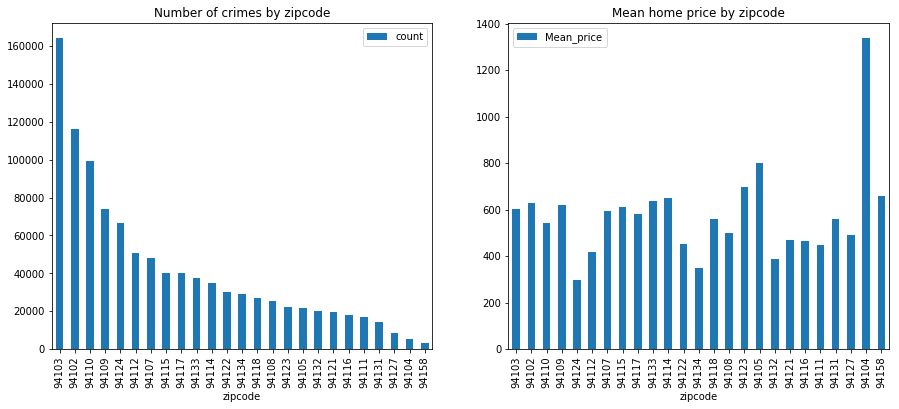

In [155]:
fig, ax = plt.subplots(ncols=2, figsize=(15,6))


crime_house.plot.bar('zipcode','count',title='Number of crimes by zipcode',ax=ax[0])

crime_house.plot.bar('zipcode','Mean_price',title='Mean home price by zipcode',ax=ax[1])

For better comparison, I use the SF zipcode Geojson file to find the zipcode area each crime record belongs in, and count the number of crimes in each area.

The choropleth maps and bar plots seem to suggest that the places with cheaper home prices tend to be more dangerous.

In [11]:
crime_sample=pd.read_sql('''SELECT time(Datetime) AS time,Lon,Lat,Category FROM crime 
                            WHERE date(Datetime) BETWEEN '2016-01-01' AND '2016-01-31' ''',db)

In [12]:
from folium.plugins import FastMarkerCluster


my_map=folium.Map(location=[37.76,-122.45],zoom_start=12)

folium.Choropleth(
    geo_data='San Francisco ZIP Codes.geojson',
    name='choropleth',
    data=sold_price,
    columns=['RegionName', 'Mean_price'],
    key_on='feature.properties.zip_code',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='House Price'
).add_to(my_map)

my_map.add_child(FastMarkerCluster(crime_sample[['Lat','Lon']].values.tolist()))
my_map

Over a million data is hard to visualize on a map,  but I'd like to take a glanceat crime from Janurary, 2016 as a sample. 

The map seems agree with the above thought.

### School vs Housing

__How are the schools of different types distributed in San Francisco?__

In [157]:
school=pd.read_sql('SELECT * FROM schools',db)
school.head()

,Name,Entity,LowerGrade,UpperGrade,GradeRange,Category,LowerAge,UpperAge,GeneralType,Address,Lat,Lon
0,Alamo Elementary School,SFUSD,0,5,K-5,USD Grades K-5,5,10,PS,"250 23RD AVE, San Francisco, CA 94121",37.783005,-122.482300
1,Alvarado Elementary School,SFUSD,0,5,K-5,USD Grades K-5,5,10,PS,"625 DOUGLASS ST, San Francisco, CA 94114",37.753681,-122.438194
2,Aptos Middle School,SFUSD,6,8,6-8,USD Grades 6-8,11,13,PS,"105 APTOS AVE, San Francisco, CA 94127",37.729672,-122.465782
3,Argonne Early Education School,SFUSD,-2,0,PK-TK,USD PreK/TK,3,5,PS,"750 16TH AVE, San Francisco, CA 94118",37.773968,-122.474060
4,Argonne Elementary School,SFUSD,0,5,K-5,USD Grades K-5,5,10,PS,"680 18TH AVE, San Francisco, CA 94121",37.775307,-122.476311


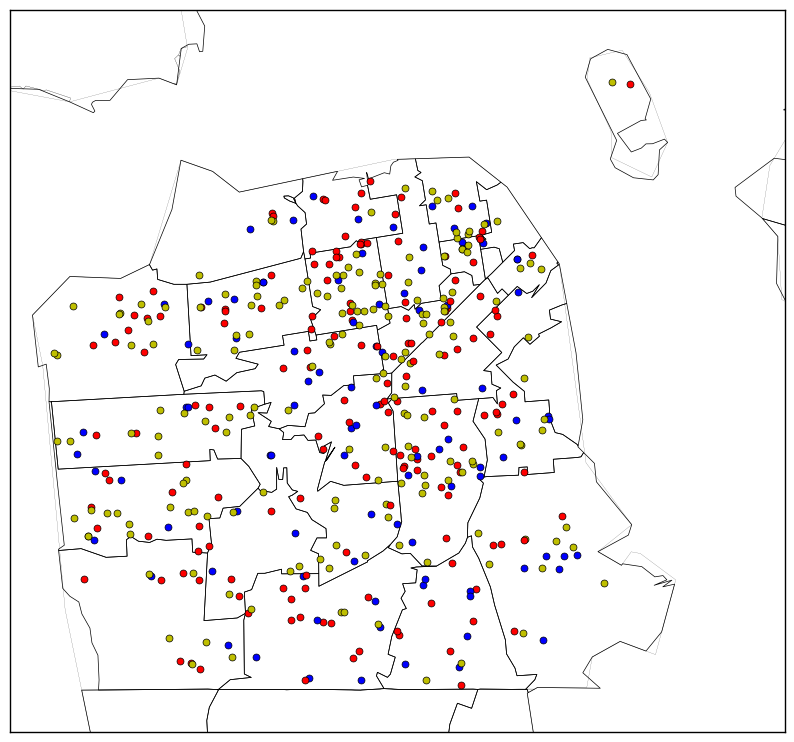

In [58]:
my_map = Basemap(llcrnrlon=-122.52, llcrnrlat=37.70, urcrnrlon=-122.33, urcrnrlat=37.84, resolution="c",
    projection="merc")

my_map.drawcounties()
my_map.readshapefile('cb_2015_us_zcta510_500k/cb_2015_us_zcta510_500k','zipcodes')

for lon, lat, age in zip(school.Lon, school.Lat, school.UpperAge):
    x, y = my_map(lon, lat)
    if age <= 5:
        color = 'y'
    elif age <= 11:
        color = 'b'
    else: color = 'r'
    my_map.plot(x, y, color+'o', markersize = 5)

Here I analysis the distribution of the schools in the city. I use UpperAge as a criterion to classify the schools. I consider the schools with kids under age 5 as kindergartens or pre-kindergartens, and they are represented by yellow points. I consider the schools with kids under age 11 as primary schools, and they are represented by blue points. I consider the schools with kids above age 10 as kindergartens or high schools, and they are represented by red points. As we can see, the schools can be regarded as even distributed. However, there are some concentrations on north-east. This makes sense because the north-east is the most busiest part of the city. Moreover, the number of each type of schools are even. 

In [159]:
my_map=folium.Map(location=[37.76,-122.45],zoom_start=12)

folium.Choropleth(
    geo_data='San Francisco ZIP Codes.geojson',
    name='choropleth',
    data=sold_price,
    columns=['zipcode', 'Mean_price'],
    key_on='feature.properties.zip_code',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='House Price'
).add_to(my_map)

# marker_cluster = MarkerCluster().add_to(my_map)

for lon, lat, age, name in zip(school.Lon, school.Lat, school.UpperAge, school.Name):
    if age <= 5:
        folium.CircleMarker([lat,lon],
            radius=2,
            popup=name,
            color='yellow',
            fill=True).add_to(my_map)
    elif age <= 11:
        folium.CircleMarker([lat,lon],
            radius=2,
            popup=name,
            color='blue',
            fill=True).add_to(my_map)
    else:
        folium.CircleMarker([lat,lon],
            radius=2,
            popup=name,
            color='red',
            fill=True).add_to(my_map)

my_map

The choropleth map indicates more schools are around areas with higher home price.

### Parks & Parking vs Housing

__What is the best place to go for trip regaring of transportation factor?__

In [161]:
park=pd.read_sql('SELECT * FROM Parks',db)
park.head()

,Name,Type,Acreage,ParkID,Lat,Lon
0,10TH AVE/CLEMENT MINI PARK,Mini Park,0.66,156,37.781844,-122.468099
1,15TH AVENUE STEPS,Mini Park,0.26,185,37.759565,-122.472268
2,24TH/YORK MINI PARK,Mini Park,0.12,51,37.753060,-122.408575
3,29TH/DIAMOND OPEN SPACE,Neighborhood Park or Playground,0.82,194,37.743602,-122.435236
4,ADAM ROGERS PARK,Neighborhood Park or Playground,2.74,46,37.731016,-122.383855


In [162]:
parking=pd.read_sql("SELECT * FROM parking",db)
parking.head()

,Owner,Address,PrimeType,SecondType,GarOrLot,RegCap,ValetCap,MCCap,LandType,Lat,Lon
0,Private,2110 Market St,PPA,,L,13,0,0,restaurant,37.767378,-122.429344
1,SFMTA,993 Potrero,PPA,,L,34,0,0,,37.757272,-122.406320
2,Port of SF,601 Terry A Francois Blvd,PPA,,L,72,0,0,,37.770135,-122.385801
3,Private,11 SOUTH VAN NESS,PHO,CPO,G,130,0,0,,37.774150,-122.418402
4,Private,101 CALIFORNIA ST,PPA,,G,250,0,0,,37.793243,-122.397495


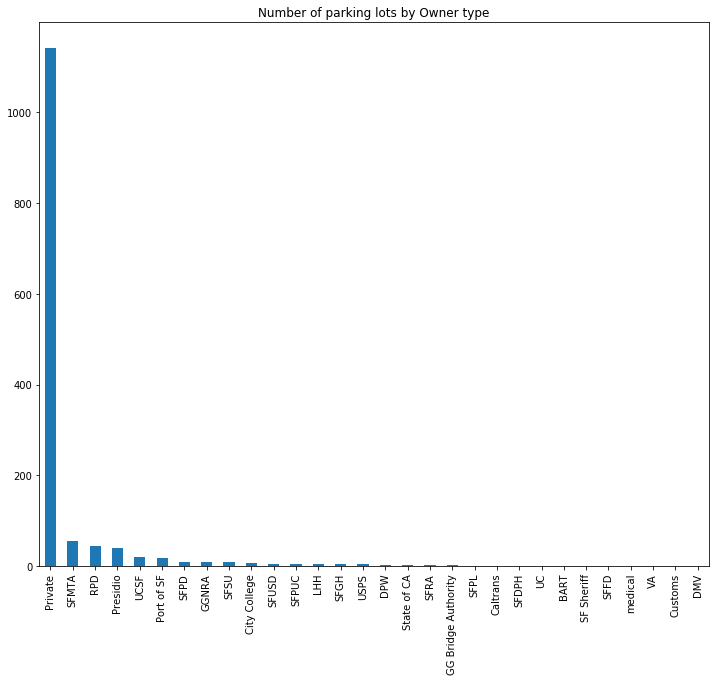

In [61]:
parking.Owner.value_counts().plot.bar(title='Number of parking lots by Owner type',figsize=(12,10))

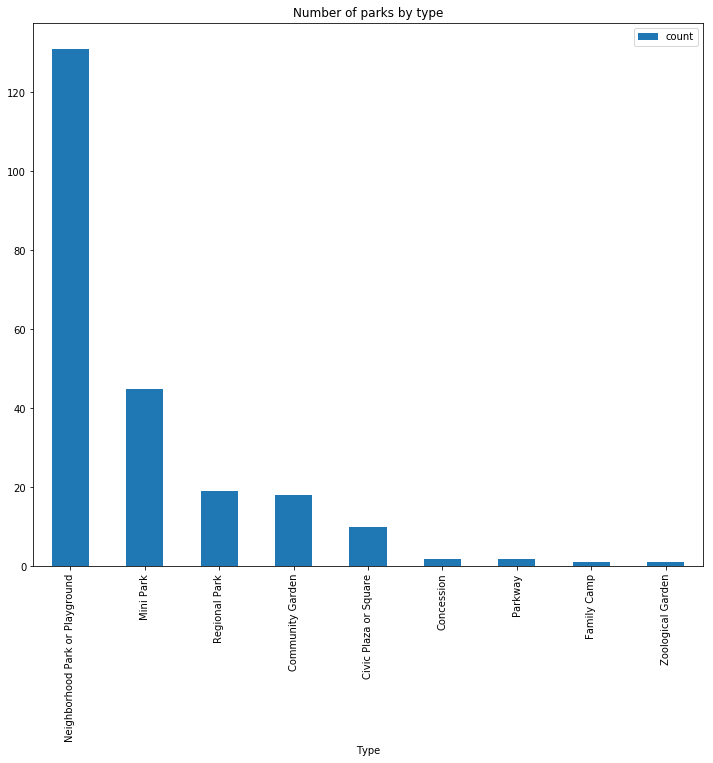

In [63]:
park_type=pd.read_sql('SELECT Type, COUNT(*) AS count FROM Parks GROUP BY Type ORDER BY COUNT(*) DESC',db)
park_type.plot.bar('Type','count',title='Number of parks by type',figsize=(12,10))

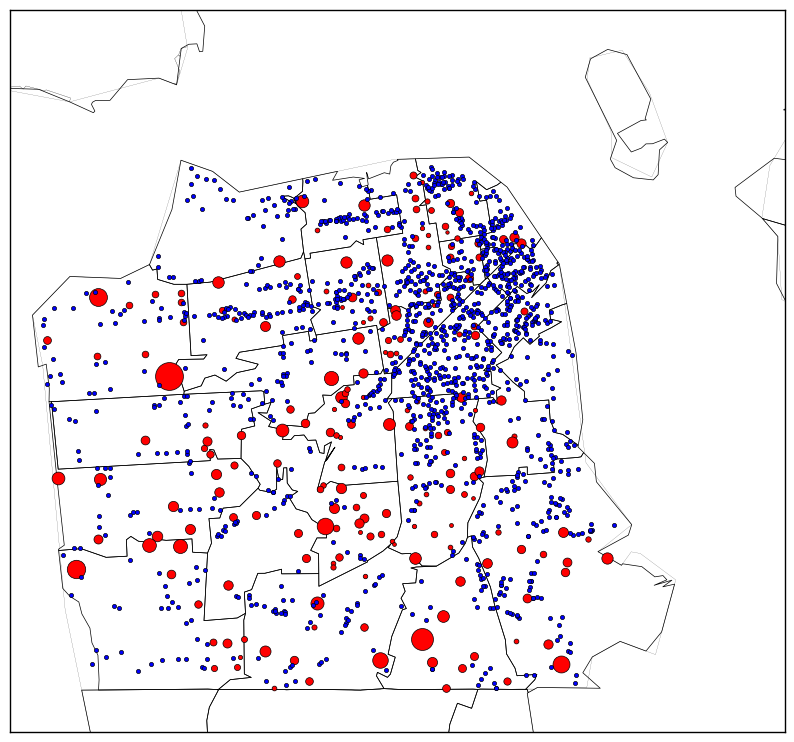

In [50]:
my_map = Basemap(llcrnrlon=-122.52, llcrnrlat=37.70, urcrnrlon=-122.33, urcrnrlat=37.84, resolution="c",
    projection="merc")

my_map.drawcounties()
my_map.readshapefile('cb_2015_us_zcta510_500k/cb_2015_us_zcta510_500k','zipcodes')

for lon, lat,arc in zip(parks.Lon, parks.Lat, parks.Acreage):
    x, y = my_map(lon, lat)
    color='r'
    my_map.plot(x, y, color + "o",markersize=(arc**0.2)*5)

for lon,lat in zip(parking.Lon,parking.Lat):
    x,y=my_map(lon,lat)
    color='b'
    my_map.plot(x, y, color + "o",markersize=3)

Here I consider the size and numnber of parks to be the factors of good parks. I plot them with red points on the map, with larger points meaning larger size. We can see that there are parks all around the city. The parks in north-east are all small since every acre in this part is gold. There are large parks in west and south that are good places to go.

I also plot the parking plots on the map as blue points. As we can see, there are tons of parking lots in north-east, and we do not need to worry too much about parking. However, there are not many parking lots near the parks on the other parts of the city even for large parks. One park on the south-east does not even have one parking lot around it. Therefore, such parks may not be good places to go.

However, one thing to be noticed is most of the parking lots are __private__ (over 1000), so maybe they should not be counted.

In [164]:
my_map=folium.Map(location=[37.76,-122.45],zoom_start=12)

folium.Choropleth(
    geo_data='San Francisco ZIP Codes.geojson',
    name='choropleth',
    data=sold_price,
    columns=['zipcode', 'Mean_price'],
    key_on='feature.properties.zip_code',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='House Price'
).add_to(my_map)

for lon, lat, name, arc in zip(park.Lon, park.Lat, park.Name, park.Acreage):
    if not pd.isnull(lon) and not pd.isnull(lon):
        folium.CircleMarker([lat,lon],
                            popup=name,
                            radius=(arc**0.2)*5,
                            color='red',
                            fill=True).add_to(my_map)
        
for lon, lat, owner in zip(parking.Lon, parking.Lat, parking.Owner):
    if owner != 'Private':
        folium.CircleMarker([lat,lon],
                            radius=2,
                            color='blue',
                            fill=True).add_to(my_map)
my_map

Here I remove all the private parking lots, now the parking lots are distributed evenly, with a little concentration on north part.

People who want to find cheap home in areas such as west and south-west may need to reconsider, because there are not many fun place to go.

### Noise vs Housing

__What is the most noisy part of the city?__

In [67]:
noise=pd.read_sql('SELECT * FROM noise',db)
noise.head()

,CaseID,Type,Address,Neighborhood,Datetime,Lat,Lon
0,5130305,other_excessive_noise,Not associated with a specific address,None,2015-09-25 00:29:33,NaN,NaN
1,6446138,amplified_sound_electronics,Intersection of CLINTON PARK and GUERRERO ST,Mission Dolores,2016-10-21 13:20:18,37.769148,-122.424475
2,5929789,other_excessive_noise,"1301 48TH AVE, SAN FRANCISCO, CA, 94122",Outer Sunset,2016-06-01 11:38:59,37.762047,-122.508365
3,5659943,other_excessive_noise,"736 LEAVENWORTH ST, SAN FRANCISCO, CA, 94109",Lower Nob Hill,2016-03-13 01:18:27,37.787983,-122.414943
4,5930704,other_excessive_noise,"1360 43RD AVE, SAN FRANCISCO, CA, 94122",Outer Sunset,2016-06-01 13:58:43,37.761385,-122.502232


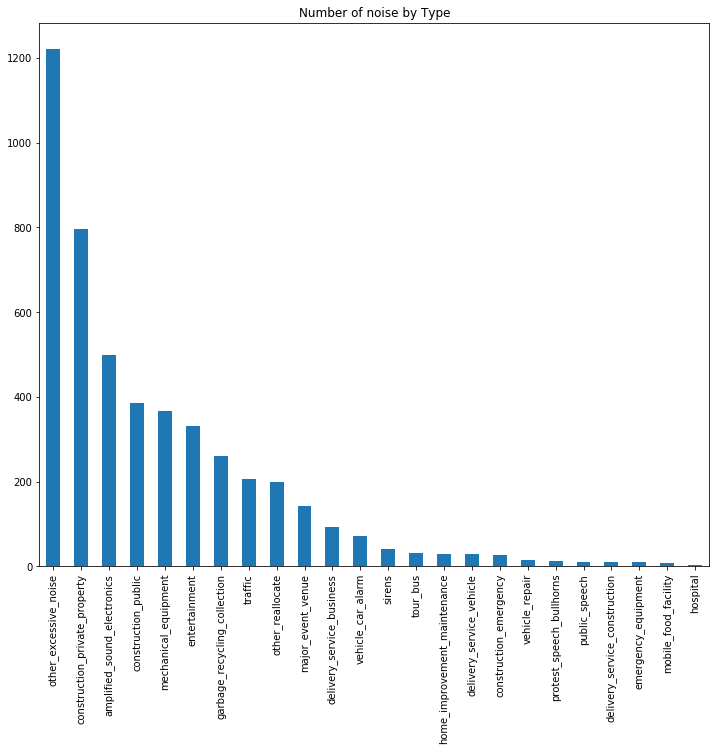

In [68]:
noise.Type.value_counts().plot.bar(title='Number of noise by Type', figsize=(12,10))

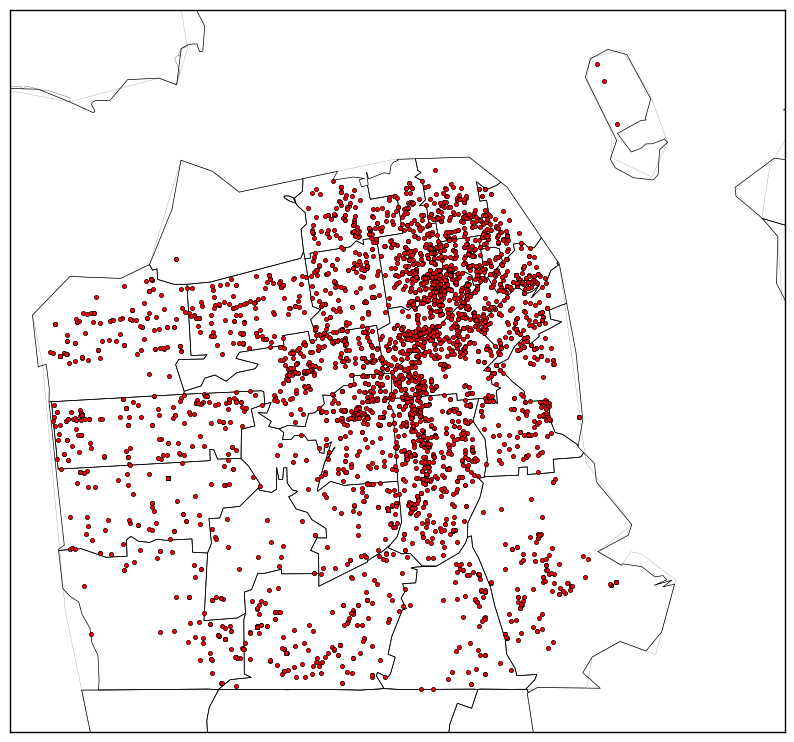

In [54]:
my_map = Basemap(llcrnrlon=-122.52, llcrnrlat=37.70, urcrnrlon=-122.33, urcrnrlat=37.84, resolution="c",
    projection="merc")

my_map.drawcounties()
my_map.readshapefile('cb_2015_us_zcta510_500k/cb_2015_us_zcta510_500k','zipcodes')

for lon,lat in zip(noise.Lon,noise.Lat):
    x,y=my_map(lon,lat)
    color='r'
    my_map.plot(x, y, color + "o",markersize=3)

Here I check the distrubution of noise in the city. I use red points to mark each record on the map. Again, it is not suprising that the part around downtown is the most noisy because of the population density, transportation. This result also reflects the former questions above.

### Food Vendors

In [165]:
pd.read_sql('SELECT * FROM mobile_food_locations',db).head()

,locationid,LocationDescription,Address,Latitude,Longitude
0,762182,TOWNSEND ST: 05TH ST to 06TH ST (400 - 499),444 TOWNSEND ST,37.774871,-122.398532
1,437211,MISSOURI ST: 20TH ST to SIERRA ST (500 - 630),555 MISSOURI ST,37.759304,-122.395902
2,765880,17TH ST: SAN BRUNO AVE to UTAH ST (2200 - 2299),2222 17TH ST,37.765216,-122.406007
3,765690,CESAR CHAVEZ ST: EVANS AVE to KANSAS ST (2100 ...,2323 CESAR CHAVEZ ST,37.748801,-122.400552
4,751253,FOLSOM ST: 14TH ST to 15TH ST (1800 - 1899),1800 FOLSOM ST,37.767852,-122.416105


In [166]:
pd.read_sql('SELECT * FROM mobile_food_permits',db).head()

,permit,Status,Applicant,FacilityType,FoodItems,PriorPermit,Approved,Expiration
0,16MFF-0027,APPROVED,F & C Catering,Truck,Cold Truck: Hot/Cold Sandwiches: Water: Soda: ...,1,2016-03-09 12:00:00,2017-03-15 12:00:00
1,13MFF-0102,EXPIRED,Natan's Catering,Truck,Burgers: melts: hot dogs: burritos:sandwiches:...,1,2013-04-12 12:00:00,2014-03-15 12:00:00
2,16MFF-0069,APPROVED,Munch A Bunch,Truck,Cold Truck: packaged sandwiches: pitas: breakf...,1,2016-03-15 12:00:00,2017-03-15 12:00:00
3,16MFF-0051,APPROVED,Park's Catering,Truck,Cold Truck: Hamburger: cheeseburgers: hot dogs...,1,2016-03-15 12:00:00,2017-03-15 12:00:00
4,16MFF-0010,REQUESTED,Pipo's Grill,Truck,Tacos: Burritos: Hot Dogs: and Hamburgers,0,None,None


In [167]:
pd.read_sql('SELECT * FROM mobile_food_schedule',db).head()

,locationid,permit,DayOfWeek,EndHour,StartHour
0,305727,11MFF-0040,Mo,15,10
1,305727,11MFF-0040,Tu,15,10
2,305727,11MFF-0040,We,15,10
3,305727,11MFF-0040,Th,15,10
4,305727,11MFF-0040,Fr,15,10


In [168]:
food_vendor_count=pd.read_sql('''SELECT COUNT(DISTINCT locationid) AS count, Applicant FROM mobile_food_schedule
INNER JOIN mobile_food_permits ON mobile_food_permits.permit=mobile_food_schedule.permit
WHERE Status='APPROVED'
GROUP BY Applicant
ORDER BY count DESC
LIMIT 10''',db)
food_vendor_count

,count,Applicant
0,23,Park's Catering
1,17,D & T Catering
2,13,F & C Catering
3,10,Munch A Bunch
4,8,Eva's Catering
5,7,BH & MT LLC
6,7,Linda's Catering
7,5,Golden Catering
8,5,"San Francisco Carts & Concessions, Inc. DBA St..."
9,4,"Bay Area Mobile Catering, Inc. dba. Taqueria A..."


The database also has three tables of food vendors. I want to see the food vendor that sells at most locations. The query gives __Park's Catering__ the most popular.

Let's also plot all the available food vendors:

In [169]:
food_vendor_location=pd.read_sql('''SELECT DISTINCT mobile_food_schedule.locationid, Latitude, Longitude,Applicant 
FROM mobile_food_schedule
INNER JOIN mobile_food_permits ON mobile_food_permits.permit=mobile_food_schedule.permit
INNER JOIN mobile_food_locations ON mobile_food_locations.locationid=mobile_food_schedule.locationid
WHERE Status='APPROVED'
''',db)
food_vendor_location.head()

,locationid,Latitude,Longitude,Applicant
0,762178,37.753109,-122.388170,F & C Catering
1,762179,37.754252,-122.389381,F & C Catering
2,762180,37.769829,-122.400101,F & C Catering
3,762181,37.780561,-122.392849,F & C Catering
4,762182,37.774871,-122.398532,F & C Catering


In [174]:
my_map=folium.Map(location=[37.76,-122.45],zoom_start=12)

folium.Choropleth(
    geo_data='San Francisco ZIP Codes.geojson',
    name='choropleth',
    data=sold_price,
    columns=['zipcode', 'Mean_price'],
    key_on='feature.properties.zip_code',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='House Price'
).add_to(my_map)

folium.GeoJson('Current Police Districts.geojson').add_to(my_map)

for lon, lat, name in zip(food_vendor_location.Longitude, food_vendor_location.Latitude, food_vendor_location.Applicant):
    folium.Marker([lat,lon],popup=name).add_to(my_map)
my_map

Most food vendors are located in Southern, Mission and Bayview PdDistrict. For people with this need, these areas should be good options for housing.

## Summary

Choosing a home when moving is always a headache. There are so many factors needed to be considered. San Francisco is a great city for convinence and fun. For people who like outdoor activities or have children, the north-east area is recommended because there are so many parks and various options of schools. However, busier places would be noiser. The north-east is not suitable for quite people. Moreover, safety is a big factor, and those who are looking for safe place should definitely avoide some of the north east area such as Mission and Southern PdDistricts. If safety is the most important factor, then the south and north-west are good choices. There is no big concern for transportation to north-east area since there are many parking lots there.